# Atividade de Classificação 

### Denini Gabriel (dgs)
### Disciplina Agentes Cognitivos e Adaptativos
### Professor Ricardo Prudencio


### **(1) Escolha um problema do seu interesse. Sugestão: pesquise no repositório de dados UCI (https://archive.ics.uci.edu/ml/datasets.php)**

Escolhi a base do problema *Cervical Cancer Behavior Risk Data Set* (https://archive.ics.uci.edu/ml/datasets/Cervical+Cancer+Behavior+Risk). Contém 19 atributos inteiros com 72 linhas e sem valores inválidos. O atributo ca_cervix representa a classificação onde 1 significa cancer e 0 não cancer.


In [ ]:
# imports
# <----ATENCAO---> se levatar error, rode novamente (bug do colab)
!pip install -U pandas-profiling
import pandas as pd
from pandas_profiling import ProfileReport
import sklearn
from sklearn.model_selection import cross_val_score
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
import warnings
warnings.filterwarnings('ignore')


In [3]:
# Cervical Cancer Behavior Risk Data Set
df = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00537/sobar-72.csv")
df.head()

,behavior_sexualRisk,behavior_eating,behavior_personalHygine,intention_aggregation,intention_commitment,attitude_consistency,attitude_spontaneity,norm_significantPerson,norm_fulfillment,perception_vulnerability,perception_severity,motivation_strength,motivation_willingness,socialSupport_emotionality,socialSupport_appreciation,socialSupport_instrumental,empowerment_knowledge,empowerment_abilities,empowerment_desires,ca_cervix
0,10,13,12,4,7,9,10,1,8,7,3,14,8,5,7,12,12,11,8,1
1,10,11,11,10,14,7,7,5,5,4,2,15,13,7,6,5,5,4,4,1
2,10,15,3,2,14,8,10,1,4,7,2,7,3,3,6,11,3,3,15,1
3,10,11,10,10,15,7,7,1,5,4,2,15,13,7,4,4,4,4,4,1
4,8,11,7,8,10,7,8,1,5,3,2,15,5,3,6,12,5,4,7,1


In [4]:
# analizando a base - demora uns 5 minutos para rodar

profile = ProfileReport(df, title='Profiling',html={'style':{'full_width':True}})
profile

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Analizando a Base

Base é desbalaceada, 70,8% sem cancer e 29,2% com cancer. Podendo enviesar o algoritmo. Poderia ser usado a tecnica de Oversampling ou Undersampling para balancear (mas não fiz, tendo em vista a utilizar os dados reais). 

### **(2) Realize a avaliação de *três* algoritmos de classificação para esse problema usando a metodologia de avaliação de validação cruzada e escolhendo uma métrica de interesse. Apresente os resultados obtidos. Justifique a métrica de avaliação escolhida e discuta os resultados.**

O objetivo da normalização é alterar os valores das colunas numéricas no conjunto de dados para uma escala comum, sem distorcer as diferenças nos intervalos de valores, já que os atributos do conjunto de dados têm intervalos diferentes.

In [5]:
# Separando a base -> 70% treino - 30% testes;
X_train, X_test, y_train, y_test = train_test_split( df.iloc[:,:-1], df.iloc[:,-1], test_size= 0.30, random_state=42)

In [6]:
# Normalizando a base
def normalize(df):
    result = df.copy()
    for feature_name in df.columns:
        max_value = df[feature_name].max()
        min_value = df[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / ((max_value - min_value) if not (max_value - min_value) == 0 else 1)
    return result

X_train = normalize(X_train)
X_test = normalize(X_test)

Algoritmo 1: *MLP* (https://scikit-learn.org/stable/modules/neural_networks_supervised.html#multi-layer-perceptron)

In [7]:
# treino MLPClassifier

clf = MLPClassifier()
mlp = GridSearchCV(clf, {'activation':["logistic", "relu", "tanh"]}, scoring="f1_macro") # GridSearchCV - testar compinação de parametros diferentes
scores = cross_val_score(mlp, X_train, y_train, cv=10, scoring="f1_macro") # cross validation de 10
print("MLP F1 Score: %0.2f; Standard deviation: %0.2f" % (scores.mean(), scores.std()))

MLP F1 Score: 0.83; Standard deviation: 0.27


Algoritmo 2: *Gradient Boosting Classifier* (https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html)

In [8]:
# treino GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier

clf = GradientBoostingClassifier()
gbc = GridSearchCV(clf, {'n_estimators':[50, 100, 200], 'max_depth': [1, 3, 5]}) # GridSearchCV - testar compinação de parametros diferentes
scores = cross_val_score(gbc, X_train, y_train, cv=10, scoring="f1_macro") # cross validation de 10
print("Gradient Boosting F1 Score: %0.2f; Standard deviation: %0.2f" % (scores.mean(), scores.std()))

Gradient Boosting F1 Score: 0.73; Standard deviation: 0.26


Algoritmo 3: *Random Forest*  (https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html)

In [9]:
# treino RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier()
rfc = GridSearchCV(clf, {'n_estimators':[50, 100, 200]}, scoring="f1_macro") # GridSearchCV - testar compinação de parametros diferentes
scores = cross_val_score(rfc, X_train, y_train, cv=10, scoring="f1_macro") # cross validation de 10
print("Random Forest F1 Score: %0.2f; Standard deviation: %0.2f" % (scores.mean(), scores.std()))

Random Forest F1 Score: 0.73; Standard deviation: 0.26


Testando os algoritmos: 

In [10]:
# teste RandomForest
rfc.fit(X_train, y_train)
model = rfc.best_estimator_
y_pred = model.predict(X_test)
rfc_score = f1_score(y_test, y_pred, average='binary')

# teste GradientBoosting
gbc.fit(X_train, y_train)
model = gbc.best_estimator_
y_pred = model.predict(X_test)
gbc_score = f1_score(y_test, y_pred, average='binary')

# teste MLP
mlp.fit(X_train, y_train)
model = mlp.best_estimator_
y_pred = model.predict(X_test)
mlp_score = f1_score(y_test, y_pred, average='binary')

print("Random Forest F1 Score: %0.2f;" % rfc_score)
print("Gradient Boosting F1 Score: %0.2f;" % gbc_score)
print("MLP F1 Score: %0.2f;" % mlp_score)

Random Forest F1 Score: 0.86;
Gradient Boosting F1 Score: 0.86;
MLP F1 Score: 0.86;


Escolhi usar a metrica *f1_score*, que é uma metrica definida como a media harmônica entre precisão e sensibilidade esta é uma boa métrica para usar ao buscar um equilíbrio entre recall e precisão, especialmente quando há desequilíbrio entre as classes.

Todos os algoritmos ficaram empatados com uma ótima pontuação de 86%.

### **(3) Aplique o algoritmo de *árvores de decisão* e discuta que variáveis foram mais importantes para o problema**

In [ ]:
# imports
from tabulate import tabulate
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

!pip install graphviz
!pip install pydotplus

In [12]:
# Criando a Arvore de decisao
clf = DecisionTreeClassifier(max_depth=20)

# Treinando
clf = clf.fit(X_train,y_train)

# Estimando
y_pred = clf.predict(X_test)

In [13]:
# O quão frequente a estimativa está correta?
print("Acuracia do Modelo:",metrics.accuracy_score(y_test, y_pred))

Acuracia do Modelo: 0.9090909090909091


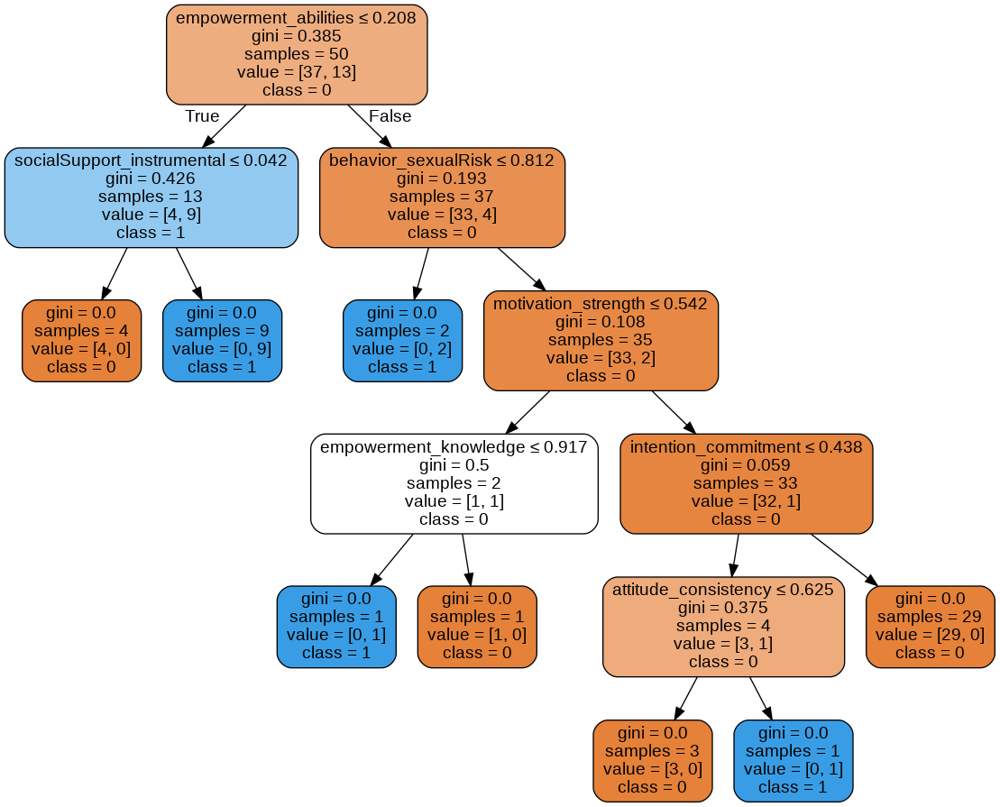

In [14]:
# Gerando o gráfico
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names = df.iloc[:,:-1].columns,
                class_names=["0","1"])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Averore de decisao.png')
Image(graph.create_png())

* A acuracia do modelo de Árvore de Decisão foi de 90%.

* O primeiro elemento da árvore é o empowerment_abilities, de certo modo a árvore é maior para a direita (quando empowerment_abilities > 0.028).

* Dos 19 atributos, 7 foram os mais importantes para a árvore: empowerment_abilities, socialSupport_instrumental, behavor_sexualRisk, motivation_strength, empowerment_knowledge, intention_commitment e attitude_consistency.